## In Preparation:
&nbsp;&nbsp;&nbsp;&nbsp;sudo pip install simplejson<br />
&nbsp;&nbsp;&nbsp;&nbsp;sudo pip install pillow<br />

## Check if you have required modules

In [12]:
from PIL import ImageFont, ImageDraw, Image
import time
import os
import random
from random import randint

### Make a directory called base/ and images/ if they do not exist
If cloned fromgit they probably will exist. 

In [1]:
!mkdir base
!mkdir images

# Get Two images from "https://jacknorthrup.com"
### or where ever else you wish.

In [26]:
!wget -O images/0003xxx.jpg https://jacknorthrup.com/INSTAGRAM/0003xxx.jpg
!wget -O images/0195insta.jpg https://jacknorthrup.com/INSTAGRAM/0195insta.jpg

--2020-02-21 07:55:52--  https://jacknorthrup.com/INSTAGRAM/0003xxx.jpg
Resolving jacknorthrup.com (jacknorthrup.com)... 192.250.236.207
Connecting to jacknorthrup.com (jacknorthrup.com)|192.250.236.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 49064 (48K) [image/jpeg]
Saving to: ‘images/0003xxx.jpg’

images/0003xxx.jpg  100%[===================>]  47.91K  --.-KB/s    in 0.002s  

2020-02-21 07:55:52 (28.0 MB/s) - ‘images/0003xxx.jpg’ saved [49064/49064]

--2020-02-21 07:55:53--  https://jacknorthrup.com/INSTAGRAM/0195insta.jpg
Resolving jacknorthrup.com (jacknorthrup.com)... 192.250.236.207
Connecting to jacknorthrup.com (jacknorthrup.com)|192.250.236.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 63325 (62K) [image/jpeg]
Saving to: ‘images/0195insta.jpg’

images/0195insta.jp 100%[===================>]  61.84K  --.-KB/s    in 0.002s  

2020-02-21 07:55:53 (33.7 MB/s) - ‘images/0195insta.jpg’ saved [63325/63325]



### Weird names made more readable and copied to images directory

In [24]:
!mv Philippine-Specialty-Paper.jpg.1 images/background.jpg
!mv postoid\ \(10\).jpg.1 images/postoid.jpg

## View the Images

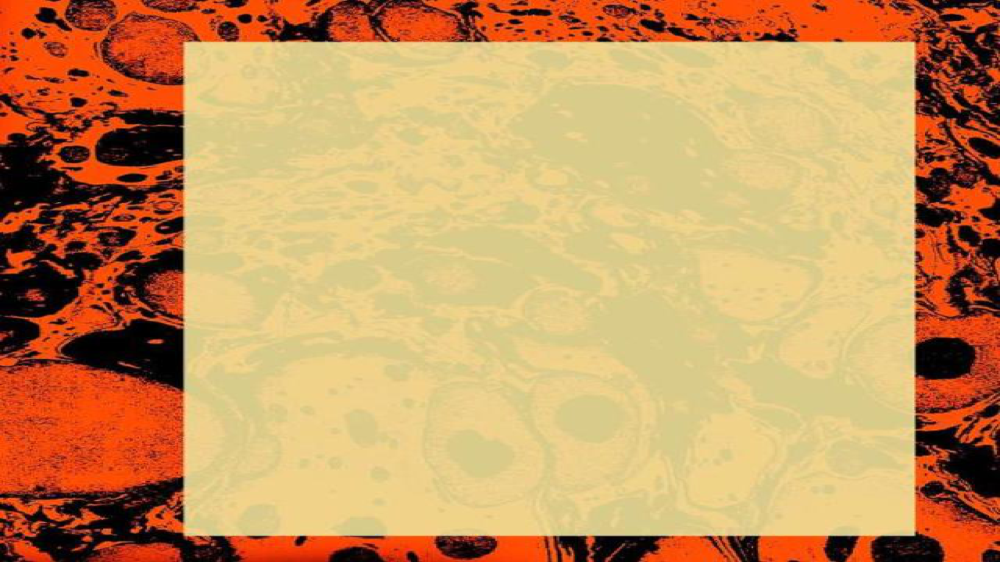

In [1]:
from PIL import Image
#IM = Image.open('images/background.jpg')
IM = Image.open('images/0195insta.jpg')
im=IM.resize((1280,720), Image.NEAREST)
im

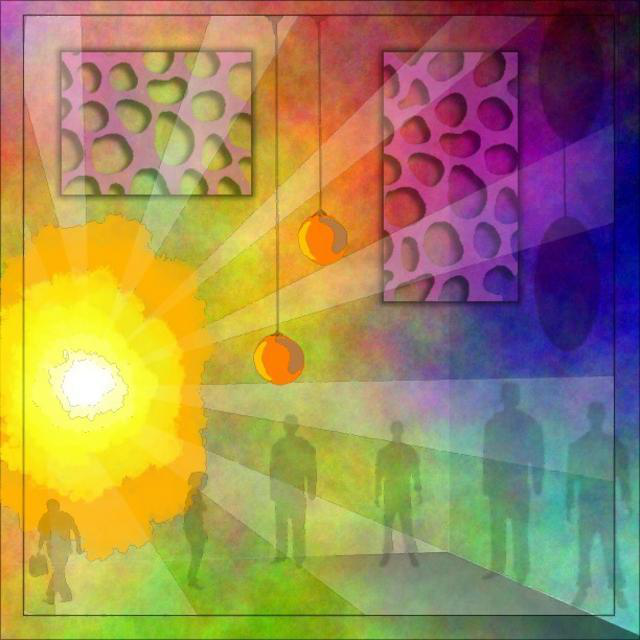

In [2]:
from PIL import Image
#IM = Image.open('images/postoid.jpg')
IM = Image.open('images/0003xxx.jpg')
IM

### You may wish to look for a specific font

!locate *.ttf

In [4]:
from PIL import ImageFont, ImageDraw, Image
import time
import os
import random
from random import randint
        
FONT='/usr/share/fonts/truetype/dejavu/DejaVuSerif-Bold.ttf'
#IMAGE1 = 'images/background.jpg'
IMAGE1 = 'images/0195insta.jpg'
image = Image.open(IMAGE1)
image = image.resize((1280,720), Image.NEAREST)
W,H = image.size
draw = ImageDraw.Draw(image)
txt = "Linux VPS  @LBRY_vps"
fontsize = 6 # starting font size
W, H = image.size
# portion of image width you want text width to be
base = Image.new('RGB',(W, H))

font = ImageFont.truetype(FONT, fontsize)
#print image.size

W,H = base.size
nSize = base.resize((W-100, H-30,), Image.NEAREST)
#print blank.size
while (font.getsize(txt)[0] < nSize.size[0]) and (font.getsize(txt)[1] < nSize.size[1]):
    # iterate until the text size is just larger than the criteria
    fontsize += 1
    font = ImageFont.truetype(FONT, fontsize)

# optionally de-increment to be sure it is less than criteria
fontsize -= 1
font = ImageFont.truetype(FONT, fontsize)

w, h = draw.textsize(txt, font=font)
#print 'final font size',fontsize, FONT
draw.text((15,605), txt, font=font, fill="black") # put the text on the image
draw.text((20,600), txt, font=font, fill="white") # put the text on the image
DT = time.strftime("base/%Y-%m-%d-%H-%M-%S.png")
image.save(DT) # save it
print (DT)

base/2020-02-21-08-54-23.png


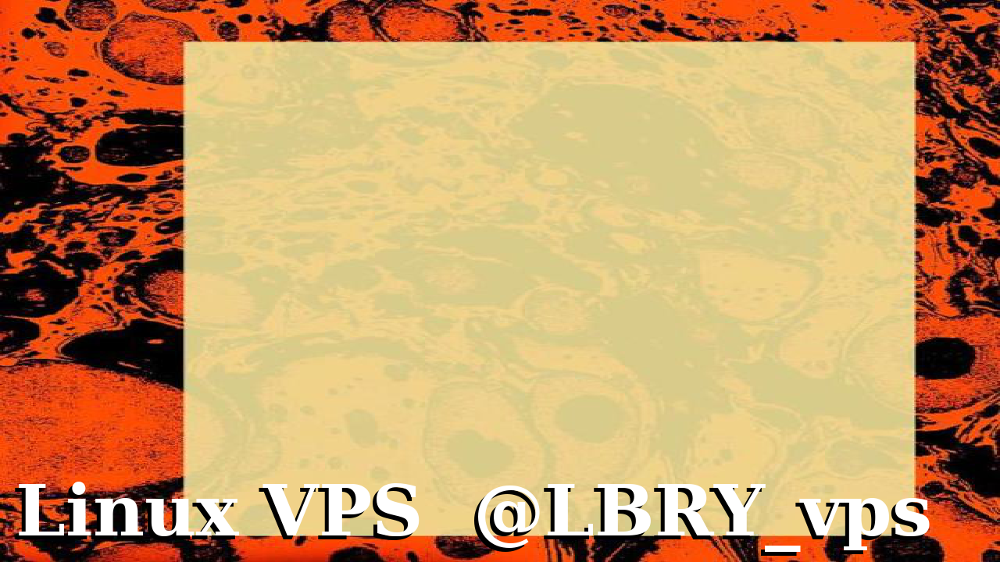

In [5]:
from PIL import Image
IM = Image.open(DT)
IM

images/TEMP01.png


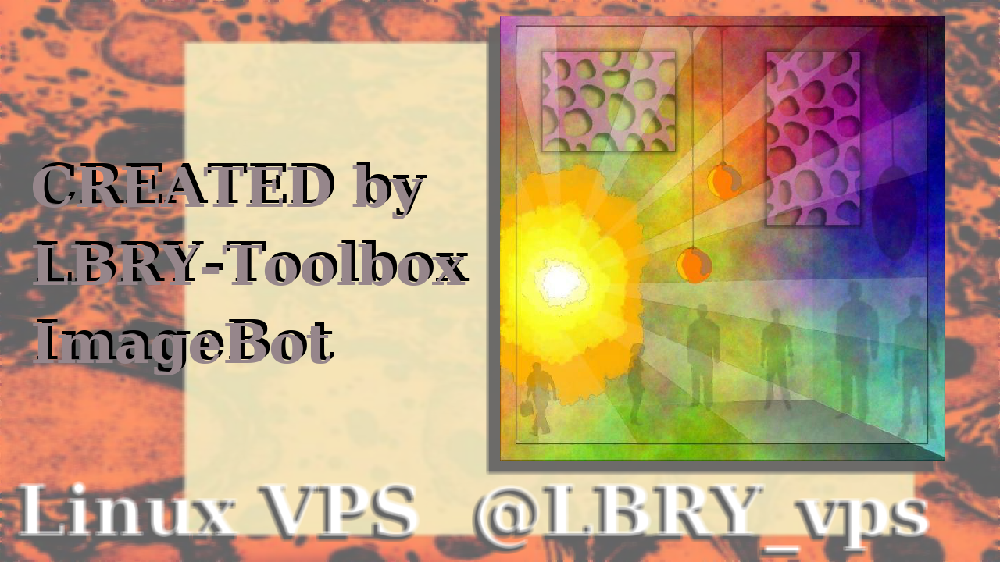

In [21]:
from PIL import ImageFilter, ImageDraw, ImageFont, Image
import time
import shutil
import os
import random
from PIL import Image
from random import randint
font_file='/usr/share/fonts/truetype/dejavu/DejaVuSerif-Bold.ttf'
file_path ="base/2020-02-21-08-54-23.png"
IMG = Image.open(file_path)
im =IMG.resize((1280,720), Image.NEAREST)

file_path0='images/0003xxx.jpg'
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((570,570), Image.NEAREST)
IMG0 = IMG0.convert('RGBA')
w,h = IMG0.size

#the shadow for the overlay
foreground = Image.new('RGBA', (w,h), (0, 0, 0, 240))
im.paste(foreground, (625, 35), foreground)
im = im.filter(ImageFilter.MinFilter(3))
background = im.filter(ImageFilter.BLUR)
# Almost transparent white
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(IMG0, (640, 20), IMG0)

text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text1)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((20+H, 170+H),text0, colours, font=font)
draw.text((20+H, 270+H),text1, colours, font=font)
draw.text((20+H, 370+H),text2, colours, font=font)
draw.text((20+H-5, 170+H+5),text0, colour, font=font)
draw.text((20+H-5, 270+H+5),text1, colour, font=font)
draw.text((20+H-5, 370+H+5),text2, colour, font=font)
#DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
DT = "images/TEMP01.png"
background.save(DT)
print (DT)

IMG = Image.open(DT)
IMG

images/2020-02-21-09-34.png


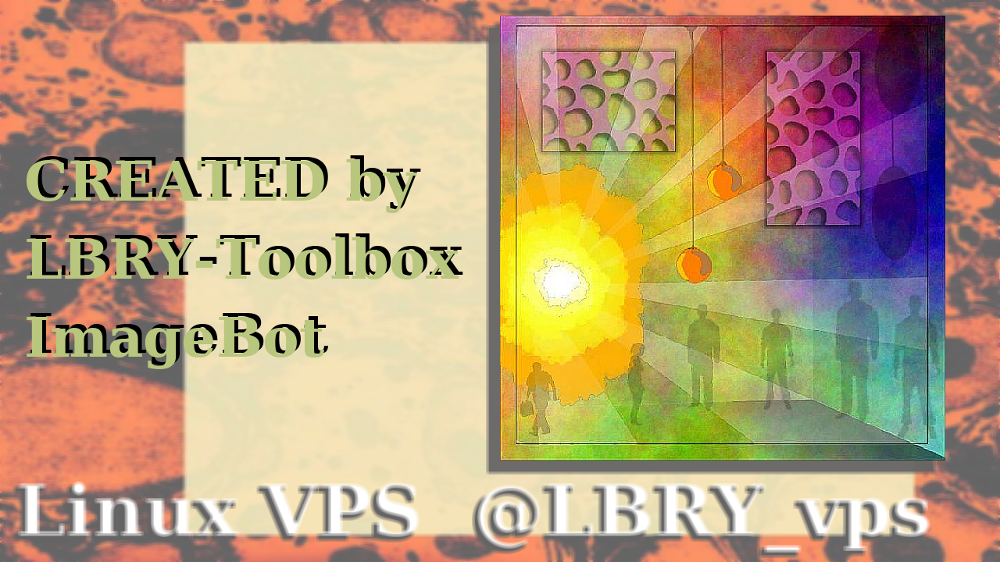

In [28]:
from PIL import ImageFilter, ImageDraw, ImageFont, Image, ImageEnhance
import time
import shutil
import os
import random
from PIL import Image
from random import randint
font_file='/usr/share/fonts/truetype/dejavu/DejaVuSerif-Bold.ttf'
file_path ="base/2020-02-21-08-54-23.png"
IMG = Image.open(file_path)
im =IMG.resize((1280,720), Image.NEAREST)

file_path0='images/0003xxx.jpg'
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((570,570), Image.NEAREST)
IMG0 = IMG0.convert('RGBA')

sharp = ImageEnhance.Sharpness(IMG0)
sharpness = 5.0
sharpened = sharp.enhance(sharpness)
w,h = sharpened.size

#the shadow for the overlay
foreground = Image.new('RGBA', (w,h), (0, 0, 0, 240))
im.paste(foreground, (625, 35), foreground)
im = im.filter(ImageFilter.MinFilter(3))
background = im.filter(ImageFilter.BLUR)
# Almost transparent white
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(sharpened, (640, 20), sharpened)

text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text1)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((20+H, 170+H),text0, colours, font=font)
draw.text((20+H, 270+H),text1, colours, font=font)
draw.text((20+H, 370+H),text2, colours, font=font)
draw.text((20+H-5, 170+H+5),text0, colour, font=font)
draw.text((20+H-5, 270+H+5),text1, colour, font=font)
draw.text((20+H-5, 370+H+5),text2, colour, font=font)
DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
#DT = "images/TEMP01.png"
background.save(DT)
print (DT)

IMG = Image.open(DT)
IMG

In [8]:
!ls images/*.jpg

images/background.jpg  images/postoid.jpg


In [11]:
TEXT ="""
The postoid below has a funny story. Notice it is the leaning tower of FRANCE   ????? 
I had some mail art rubbber art stamps made. The set was in fact the same as the white postoid / mail art paper in our mail art specialty paper set. As soon as they came in I started stamping and playing with ideas. I made postoids until about 2:30am. That is when I made this four corner stamp. It wasn't until I had finished I realized I put the leaning tower of Pisa in my france stamp.
My faux stamp misprint
"""    
    

In [ ]:
requests.post("http://localhost:5279", json={"method": "channel_create", "params": {"name": "@LBRY-vps", "bid": "1.0", "tags": "vps"}}).json()

# Create a Channel
lbry://@lbry-vps#0dba0712be1bf830f8c2c11872399d5f61704dbf<br />
https://lbry.tv/@lbry-vps:0

In [56]:
#!/usr/bin/python2
import time
import urllib
import simplejson as json
import requests
data = requests.post("http://localhost:5279", json={"method": "channel_create", "params": {"name": "@lbry-vps", "bid": "2.0", "tags": "vps"}}).json()
LINES = (json.dumps(data, indent=2 * ' '))
Lin =str(LINES)
L = Lin.split("\n")
for lines in L:
        print (lines)


{
  "jsonrpc": "2.0",
  "result": {
    "height": -2,
    "hex": "010000000152e2e4030db54e3c3677cac5cdb610b54e02cfe2403ed690a1105547f5b1e421000000006b483045022100c0baf523281c6e68cd81c5b5f2da3c9e3d386b535ae4e386290818bfec5df55402207dd000f1ebb72eb82f028be57b0f69dd26271c7d53b33277402ecbffac1ededa012102d1638692fe082417c87fdc449a13bf3cca622227de192b063eaf660329d6dcc8ffffffff0200c2eb0b000000008ab509406c6272792d7670734c6200125a0a583056301006072a8648ce3d020106052b8104000a03420004bfd9707512986705cf0bbf59e26e1e182499cf734bbc0522a180817837f5a5b7fc2a6cc95fb806d11442a1c5c19b610cf7a5f6dd98c39225738d80c6996e81815a037670736d7576a914c6d83b9168c42fb8972f05c3adab67f0fa88a9f388acf420d00b000000001976a9141af2da79dfb3a6200fe1c731e6c71771aa3223d188ac00000000",
    "inputs": [
      {
        "address": "bUkx9BomeyGBr39kZdDzuRKhCPgL6goEn3",
        "amount": "4.0",
        "confirmations": 13,
        "height": 719026,
        "is_change": false,
        "is_mine": true,
        "nout": 0,
        "timestamp":

# PUBLISH

In [22]:
!ls *.mp4

Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4


# This is @LBRY_VPS
c133f925c7b68affa500c9b5492c1e16089aa17e <br/>
lbry://@LBRY-VPS#c133f925c7b68affa500c9b5492c1e16089aa17e

In [23]:
#!/usr/bin/python2
import time
import urllib
import simplejson as json
import requests
name = "Posting-From-my-VPS" #no Spaces or Special Characters
title = "Javascript KdenliveFfmpeg Generated Video"
file_Path = "/home/jack/Desktop/LBRY-toolbox/Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4"
thumbnail = "https://lbry-toolbox.com/images/2020-02-21-04-59-24.png"
Text="""
In 1984 I was a heavy equipment mechanic. I knew I couldn't continue this type of work 
my entire life. One day, I was in my pickup truck on my way home from an extraordinarily 
difficult project and noticed a gaudy looking changeable letter sign. 
That sign read, "FREE - Adult Education: Introduction to computers”. I wrote the phone 
number in the dust of my pickup truck. Little did I know that phone number, in the dust 
on my dashboard, would change my life. I went to that course for about a week. I loved 
the concept of computers, but It was so crowded there was very little computer time. 
However, I loved the fact if you communicated properly and it always listened and did 
as you wish. I bought my first computer, my first of well over a hundred in all. 
I actually started building and selling computers just to keep up with the changing systems.
I retired from a career as a self-taught electrical engineer specializing in computer automation.
I am nearing seventy-two and still love the computer. I am a devoted Linux man and am thoroughly
devoted to LBRY. I am using the LBRY platform to learn several computer languages. Life is good!
Follow me here and on lbry.tv. Read the description for more details.
Music from https://filmmusic.io "Sovereign" by Kevin MacLeod (https://incompetech.com)
License: CC BY (http://creativecommons.org/licenses/by/4.0/)
"""
data = requests.post("http://localhost:5279", json={"method": "publish", "params": {"name": name, "bid": "0.01", "title": title, "file_path": file_Path, "tags": "VPS","description":Text, "thumbnail_url": thumbnail,"channel_id": "c133f925c7b68affa500c9b5492c1e16089aa17e"}}).json()
LINES = (json.dumps(data, indent=2 * ' '))
Lin =str(LINES)
L = Lin.split("\n")
for lines in L:
        print (lines)


{
  "jsonrpc": "2.0",
  "result": {
    "height": -2,
    "hex": "0100000001583b0868ac27530a15ab7b42f349284122308a2c3506046973a754ae36739546010000006a473044022036de2b91b66eec0b5d530be7e2242cba3ecc11acdeed3ac69a3a73ae1a3a87f202204fdb8938bef20466b935f136f72c644095b3b94e1d47b5b40991cf9fd6de0976012102586732de9bde9fe7578d1b2844e447220bd04c2bbe965f7bdcc8e64bfa7d0a4dffffffff0240420f0000000000fd1a07b513506f7374696e672d46726f6d2d6d792d5650534de706017ea19a08161e2c49b5c900a5ff8ab6c725f933c12d3de8fd513ad43a0c80a05a04ea1d21a9b5a29c9d99990538209ff5e901b914a3fdb55524d420bb95a4796bd85fe2f6e08ef3d770afee11f4355678fa32c7690ac2010ab4010a303f0665a9cb58aacf5674f3b6cc8dd190f9cb773f287936e2a39330b5084e0c70d994b64b1d24b7991f5cafe73c370b69123e436f6d70757465722d47726170686963732d4a6176617363726970742d4b64656e6c6976652d4f70656e2d536f757263652d536f6674776172652e6d703418baf7ef382209766964656f2f6d7034323079c83e365f14398816814f6ef46df7c1f7d3a0b84fbd1866baaabf9f4ba14ceba9e5822d89b276a3ef93e6122692eadd5a0908800a10d005

In [8]:
!ffmpeg -i Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4 -vframes 1 -an -s 1280x720 -ss 26 -y OutputFile.jpg

ffmpeg version 2.8.15-0ubuntu0.16.04.1 Copyright (c) 2000-2018 the FFmpeg developers
  built with gcc 5.4.0 (Ubuntu 5.4.0-6ubuntu1~16.04.10) 20160609
  configuration: --prefix=/usr --extra-version=0ubuntu0.16.04.1 --build-suffix=-ffmpeg --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --cc=cc --cxx=g++ --enable-gpl --enable-shared --disable-stripping --disable-decoder=libopenjpeg --disable-decoder=libschroedinger --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmodplug --enable-libmp3lame --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librtmp --enable-libschroedinger --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --

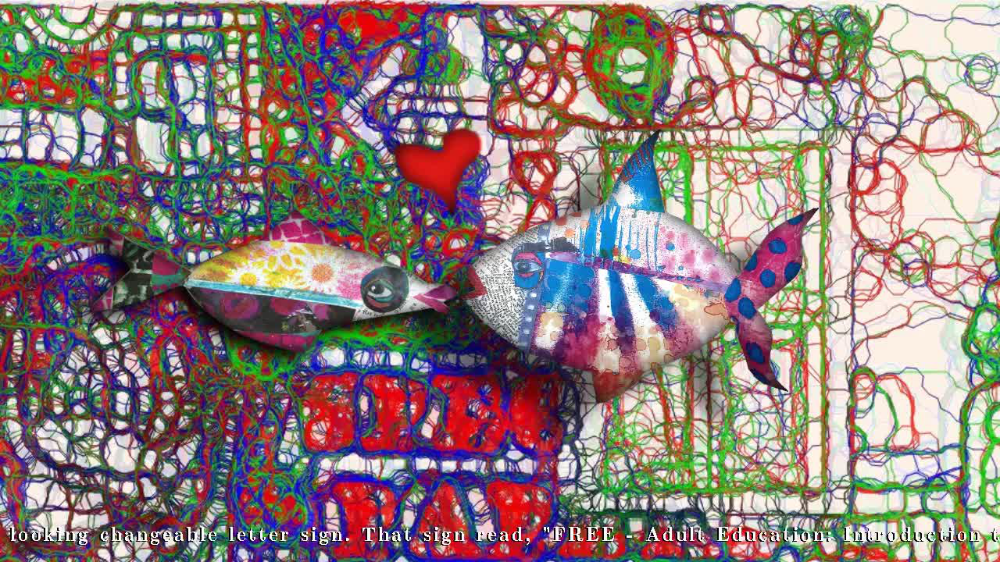

In [9]:
from PIL import Image
IM= Image.open("OutputFile.jpg")
IM

In [3]:
!ffmpeg -i Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4

ffmpeg version 2.8.15-0ubuntu0.16.04.1 Copyright (c) 2000-2018 the FFmpeg developers
  built with gcc 5.4.0 (Ubuntu 5.4.0-6ubuntu1~16.04.10) 20160609
  configuration: --prefix=/usr --extra-version=0ubuntu0.16.04.1 --build-suffix=-ffmpeg --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --cc=cc --cxx=g++ --enable-gpl --enable-shared --disable-stripping --disable-decoder=libopenjpeg --disable-decoder=libschroedinger --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmodplug --enable-libmp3lame --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librtmp --enable-libschroedinger --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --

# This is @LBRY_vps
0dba0712be1bf830f8c2c11872399d5f61704dbf

In [98]:
#!/usr/bin/python2
import time
import urllib
import simplejson as json
import requests
name = "First-Post-of-Wallet-Plot" #no Spaces or Special Characters
title = "This will be fun to look back at"
image = "/home/jack/Desktop/LBRY-toolbox/Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4"
thumbnail = "/home/jack/Desktop/VPS_resources/202002201016-final.png"
Text="""
I got a plot of the first two tips. WOW !
"""
data = requests.post("http://localhost:5279", json={"method": "publish", "params": {"name": name, "bid": "0.01", "title": title, "file_path": image, "tags": "LBC Plot","description":Text, "thumbnail_url": image, "channel_id": "0dba0712be1bf830f8c2c11872399d5f61704dbf" }}).json()
LINES = (json.dumps(data, indent=2 * ' '))
Lin =str(LINES)
L = Lin.split("\n")
for lines in L:
      print (lines)


{
  "jsonrpc": "2.0",
  "result": {
    "height": -2,
    "hex": "0100000001a438166e77f6a3fef8959412bc7b6d82d42a050850031e21001a52f9637d8cb1010000006b483045022100873171378c6f9a8a5755696aa05bfcae6538fedb0ebbcb374a6568825e171b650220329444d74cb4a21398320fbe85390dbb3cd61f49da3e7ed5c0b896145a39c5f3012103f49e6162940ccb8c4117db3f5626a4e31a9dfc62e35f119349d2c59ab27fdee4ffffffff0240420f0000000000fdbb01b51946697273742d506f73742d6f662d57616c6c65742d506c6f744d820101bf4d70615f9d397218c1c2f830f81bbe1207ba0df17e6105359eaec81f733e99ad45e117baf246b4bf7d6203d1da58a564e60dccf2175d94157560f4967c9a8ec7290d97119ac42f6d099c6da28d30171a4ed94a0a96010a8b010a307cfbe36a1bf4ddaa8c3446a402885ab71de75472a893d5a90619d37f724f7863754cf4bb94e2e36a826f523547f4ee5912163230323030323230313031362d66696e616c2e706e6718a4bc072209696d6167652f706e6732303d8262225802d111a789f196446e61310bdb2c780d5a961f7dc1a893971002132c0afb00171930fa7deb30d44e80922a520608800a10d0054220546869732077696c6c2062652066756e20746f206c6f6f6b206261636b206174

In [ ]:
0dba0712be1bf830f8c2c11872399d5f61704dbf

In [1]:
!ls Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4

Computer-Graphics-Javascript-Kdenlive-Open-Source-Software.mp4


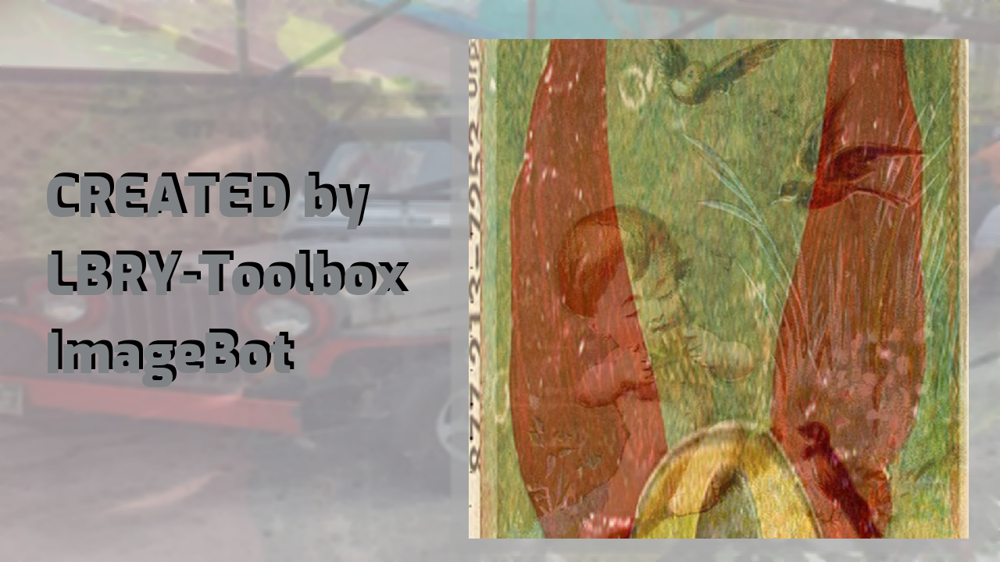

In [145]:
from PIL import ImageFilter, ImageDraw, ImageFont
import time
import shutil
import os
import random
from PIL import Image
from random import randint
path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
img = random.choice(os.listdir(path))
path0 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
img0 = random.choice(os.listdir(path0))
file_path =path+img
file_path0 =path0+img0
IMG = Image.open(file_path)
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((640,640), Image.NEAREST)
w,h = IMG0.size
IMG1 = IMG0.convert('RGBA')
im =IMG.resize((1280,720), Image.NEAREST)
foreground = Image.new('RGBA', (w+5,h+5), (0, 0, 0, 150))
im.paste(foreground, (580, 60), foreground)
im1 = im.filter(ImageFilter.MinFilter(7))
background = im1.filter(ImageFilter.BLUR)
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(IMG1, (600, 50), IMG1)
background
text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)

if x==1:font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
if x==2:font_file ="/home/jack/fonts/Biryani-Black.ttf"
if x==3:font_file ="/home/jack/fonts/ChangaOne-Regular.ttf"
if x==4:font_file ="/home/jack/fonts/Exo-Black.ttf"
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((30+H, 170+H),text0, colours, font=font)
draw.text((30+H, 270+H),text1, colours, font=font)
draw.text((30+H, 370+H),text2, colours, font=font)
draw.text((30+H-5, 170+H+5),text0, colour, font=font)
draw.text((30+H-5, 270+H+5),text1, colour, font=font)
draw.text((30+H-5, 370+H+5),text2, colour, font=font)
DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
background.save(DT)

from PIL import Image
file_path = DT
IMG = Image.open(file_path)
IMG

In [277]:
from PIL import ImageFont, ImageDraw, Image
import time
import os
import random
from random import randint
def pick(font_path):    
        
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
def mkimage(path1):
    
    img = random.choice(os.listdir(path1))
    file_path =path1+img 
    return file_path

def mkbatch(mkimage,pick):
    image = Image.open(mkimage)
    image = image.resize((1280,720), Image.NEAREST)
    W,H = image.size
    draw = ImageDraw.Draw(image)
    txt = "Python Generated /Processed Images"
    fontsize = 6 # starting font size

    W, H = image.size

    # portion of image width you want text width to be
    blank = Image.new('RGB',(W, H))

    FONT = pick
    font = ImageFont.truetype(FONT, fontsize)
    #print image.size

    W,H = blank.size
    blank = blank.resize((W-100, H-30,), Image.NEAREST)
    #print blank.size
    while (font.getsize(txt)[0] < blank.size[0]) and (font.getsize(txt)[1] < blank.size[1]):
        # iterate until the text size is just larger than the criteria
        fontsize += 1
        font = ImageFont.truetype(FONT, fontsize)

    # optionally de-increment to be sure it is less than criteria
    fontsize -= 1
    font = ImageFont.truetype(FONT, fontsize)

    w, h = draw.textsize(txt, font=font)

    #print 'final font size',fontsize, FONT
    draw.text((15,625), txt, font=font, fill="black") # put the text on the image
    draw.text((20,620), txt, font=font, fill="white") # put the text on the image
    DT = time.strftime("base/%Y-%m-%d-%H-%M-%S.png")
    image.save(DT) # save it
    #image
for i in range(1,500):
    path1 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
    font_path = '/home/jack/fonts/'
    mkbatch(mkimage(path1),pick(font_path))
    time.sleep(3)
    print ".",

 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

IOError: unknown file format

In [15]:
!locate *.ttf

/home/jack/.cache/yarn/v6/npm-devtron-1.4.0-b5e748bd6e95bbe70bfcc68aae6fe696119441e1-integrity/node_modules/devtron/vendor/bootstrap/fonts/glyphicons-halflings-regular.ttf
/home/jack/.cache/yarn/v6/npm-devtron-1.4.0-b5e748bd6e95bbe70bfcc68aae6fe696119441e1-integrity/node_modules/devtron/vendor/photon/fonts/photon-entypo.ttf
/home/jack/.cache/yarn/v6/npm-three-0.93.0-3fd6c367ef4554abbb6e16ad69936283e895c123-integrity/node_modules/three/examples/fonts/ttf/kenpixel.ttf
/home/jack/.cache/yarn/v6/npm-three-full-17.1.0-ecab0ff39c76c94530cda50d40fb9d66b2141701-integrity/node_modules/three-full/sources/fonts/ttf/kenpixel.ttf
/home/jack/.cache/yarn/v6/npm-video-js-7.5.4-7c76d44123be48f98333ab50b19d7683bfa8aba6-integrity/node_modules/video.js/dist/font/VideoJS.ttf
/home/jack/.cache/yarn/v6/npm-video-js-7.6.6-e7c9163d53f9b0e05ccb5ac0f79d02fa49b4d3ac-integrity/node_modules/video.js/dist/font/VideoJS.ttf
/home/jack/.cache/yarn/v6/npm-videojs-font-3.1.0-ac33be9b517fe19299f61cccd2b3c7d75a1c6960-integ

(1280, 720)
final font size 75 /usr/local/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf
base/2020-02-21-04-59-24.png


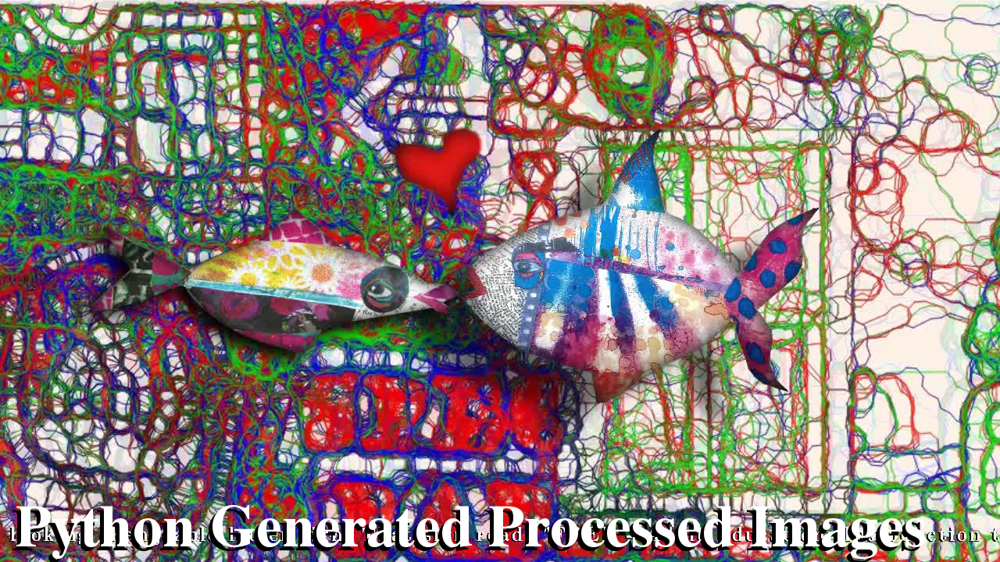

In [20]:
from PIL import ImageFont, ImageDraw, Image
import time
image = Image.open("OutputFile.jpg")
image = image.resize((1280,720), Image.NEAREST)
W,H = image.size
draw = ImageDraw.Draw(image)
txt = "Python Generated Processed Images"
fontsize = 6 # starting font size

W, H = image.size

# portion of image width you want text width to be
blank = Image.new('RGB',(W, H))

FONT = "/usr/local/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf"
font = ImageFont.truetype(FONT, fontsize)
print (image.size)

W,H = blank.size
blank = blank.resize((W-100, H-30,), Image.NEAREST)
#print blank.size
while (font.getsize(txt)[0] < blank.size[0]) and (font.getsize(txt)[1] < blank.size[1]):
    # iterate until the text size is just larger than the criteria
    fontsize += 1
    font = ImageFont.truetype(FONT, fontsize)

# optionally de-increment to be sure it is less than criteria
fontsize -= 1
font = ImageFont.truetype(FONT, fontsize)

w, h = draw.textsize(txt, font=font)

print ('final font size',fontsize, FONT)
draw.text((15,625), txt, font=font, fill="black") # put the text on the image
draw.text((20,620), txt, font=font, fill="white") # put the text on the image
DT = time.strftime("base/%Y-%m-%d-%H-%M-%S.png")
print (DT)
image.save(DT) # save it
image

(1280, 720)
(1180, 690)
final font size 61 /home/jack/fonts/DejaVuSerif.ttf


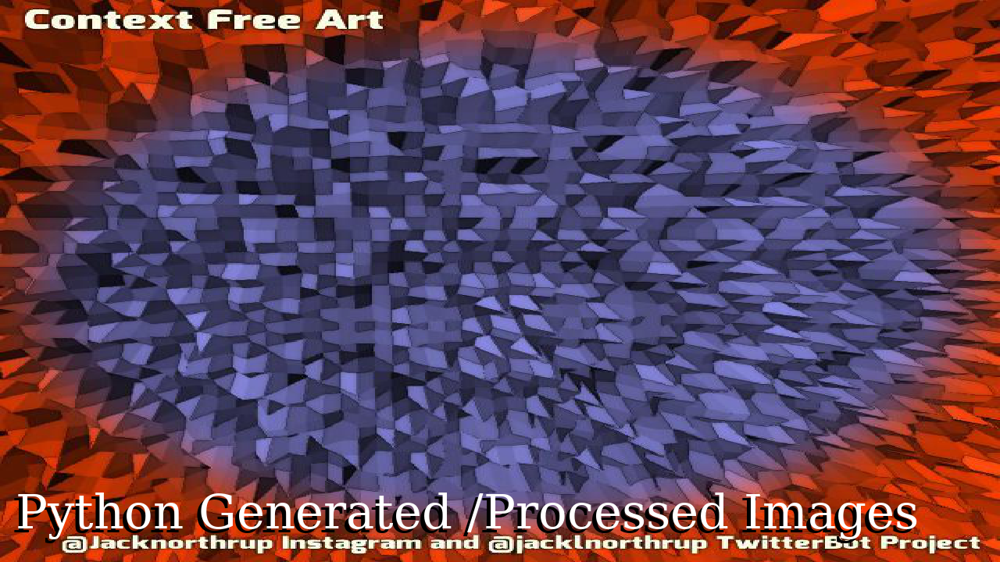

In [264]:
from PIL import ImageFont, ImageDraw, Image
def pick():    
        font_path = '/home/jack/fonts/'
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
def mkimage():
    path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
    img = random.choice(os.listdir(path))
    file_path =path+img 
    return file_path

image = Image.open(mkimage())
image = image.resize((1280,720), Image.NEAREST)
W,H = image.size
draw = ImageDraw.Draw(image)
txt = "Python Generated Processed Images"
fontsize = 6 # starting font size

W, H = image.size

# portion of image width you want text width to be
blank = Image.new('RGB',(W, H))

FONT = pick()
font = ImageFont.truetype(FONT, fontsize)
print image.size

W,H = blank.size
blank = blank.resize((W-100, H-30,), Image.NEAREST)
print blank.size
while (font.getsize(txt)[0] < blank.size[0]) and (font.getsize(txt)[1] < blank.size[1]):
    # iterate until the text size is just larger than the criteria
    fontsize += 1
    font = ImageFont.truetype(FONT, fontsize)

# optionally de-increment to be sure it is less than criteria
fontsize -= 1
font = ImageFont.truetype(FONT, fontsize)

w, h = draw.textsize(txt, font=font)

print 'final font size',fontsize, FONT
draw.text((15,625), txt, font=font, fill="black") # put the text on the image
draw.text((20,620), txt, font=font, fill="white") # put the text on the image
DT = time.strftime("base/%Y-%m-%d-%H-%M-%S.png")
image.save(DT) # save it
image

In [ ]:
/home/jack/fonts/Quatl.ttf
/home/jack/fonts/Exo-Black.ttf
/home/jack/fonts/Rafika.ttf
/home/jack/fonts/georgiab.ttf
/home/jack/fonts/Biryani-Light.ttf
/home/jack/fonts/Regulators.ttf
/home/jack/fonts/Quatl.ttf
/home/jack/fonts/DancingScript-VariableFont_wght.ttf
/home/jack/fonts/Tafelschrift.ttf     (nice script)
/home/jack/fonts/VeraSe.ttf

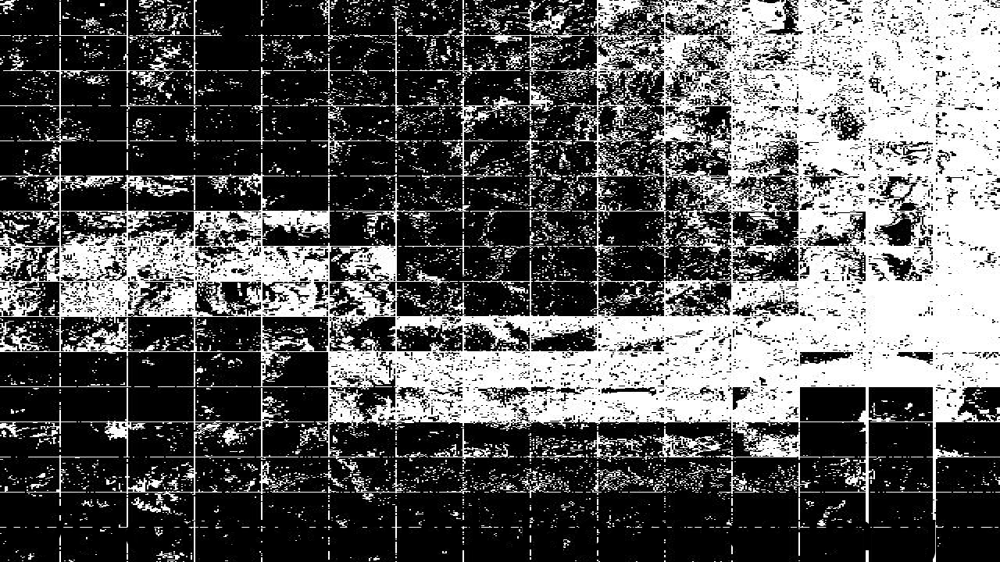

In [223]:
IMG=Image.open("sample-out.png")
IMG

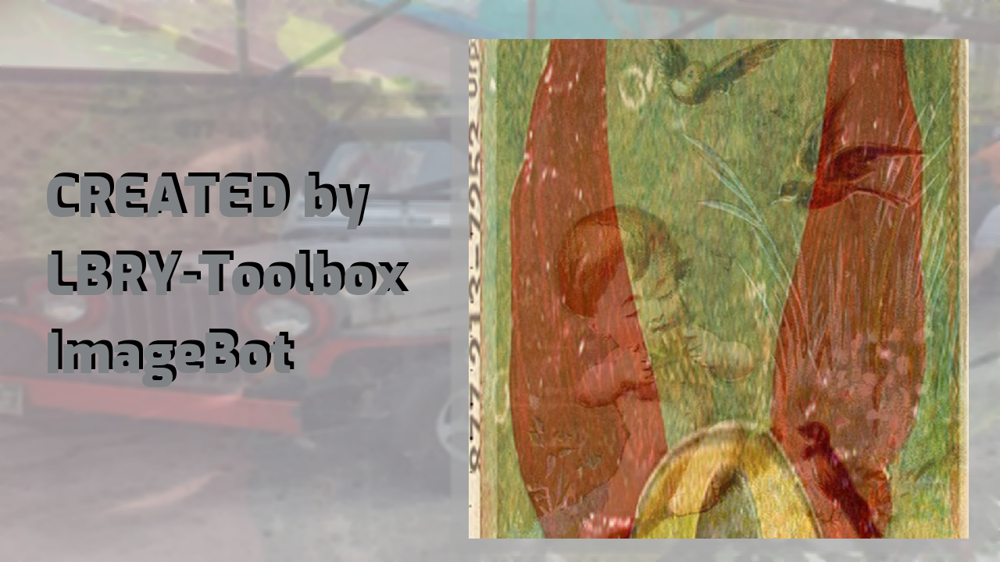

In [145]:
from PIL import ImageFilter, ImageDraw, ImageFont
import time
import shutil
import os
import random
from PIL import Image
from random import randint
path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
img = random.choice(os.listdir(path))
path0 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
img0 = random.choice(os.listdir(path0))
file_path =path+img
file_path0 =path0+img0
IMG = Image.open(file_path)
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((640,640), Image.NEAREST)
w,h = IMG0.size
IMG1 = IMG0.convert('RGBA')
im =IMG.resize((1280,720), Image.NEAREST)
foreground = Image.new('RGBA', (w+5,h+5), (0, 0, 0, 150))
im.paste(foreground, (580, 60), foreground)
im1 = im.filter(ImageFilter.MinFilter(7))
background = im1.filter(ImageFilter.BLUR)
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(IMG1, (600, 50), IMG1)
background
text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)

if x==1:font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
if x==2:font_file ="/home/jack/fonts/Biryani-Black.ttf"
if x==3:font_file ="/home/jack/fonts/ChangaOne-Regular.ttf"
if x==4:font_file ="/home/jack/fonts/Exo-Black.ttf"
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((30+H, 170+H),text0, colours, font=font)
draw.text((30+H, 270+H),text1, colours, font=font)
draw.text((30+H, 370+H),text2, colours, font=font)
draw.text((30+H-5, 170+H+5),text0, colour, font=font)
draw.text((30+H-5, 270+H+5),text1, colour, font=font)
draw.text((30+H-5, 370+H+5),text2, colour, font=font)
DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
background.save(DT)

from PIL import Image
file_path = DT
IMG = Image.open(file_path)
IMG

In [ ]:
from PIL import ImageFilter, ImageDraw, ImageFont
import time
import shutil
import os
import random
from PIL import Image
from random import randint
def pick():    
        font_path = '/home/jack/fonts/'
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
def mkimage():
    path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
    img = random.choice(os.listdir(path))
    file_path =path+img 
    path0 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
    img0 = random.choice(os.listdir(path0))
    file_path0 =path0+img0
    IMG = Image.open(file_path)
    IMG0 = Image.open(file_path0)
    IMG0 =IMG0.resize((640,640), Image.NEAREST)
    w,h = IMG0.size
    IMG1 = IMG0.convert('RGBA')
    im =IMG.resize((1280,720), Image.NEAREST)
    foreground = Image.new('RGBA', (w+5,h+5), (0, 0, 0, 150))
    im.paste(foreground, (580, 60), foreground)
    im1 = im.filter(ImageFilter.MinFilter(7))
    background = im1.filter(ImageFilter.BLUR)
    foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
    background.paste(foreground1, (0, 0), foreground1)
    background.paste(IMG1, (600, 50), IMG1)
    background
    text0 = "CREATED by"
    text1 = "LBRY-Toolbox"
    text2 = "ImageBot"
    x= randint(1,4)
    r=randint(125,200)
    g=randint(125,200)
    b=randint(125,200)
    colour = (r, g, b)
    colours = (0,0,0)
    font_file = pick()
    #font_file = random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
    #if x==1:font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
    #if x==2:font_file ="/home/jack/fonts/Biryani-Black.ttf"
    #if x==3:font_file ="/home/jack/fonts/ChangaOne-Regular.ttf"
    #if x==4:font_file ="/home/jack/fonts/Exo-Black.ttf"
    font_size = 70
    font = ImageFont.truetype(font_file, font_size)
    w, h = font.getsize(text)
    draw = ImageDraw.Draw(background)
    H=x*8
    draw.text((30+H, 170+H),text0, colours, font=font)
    draw.text((30+H, 270+H),text1, colours, font=font)
    draw.text((30+H, 370+H),text2, colours, font=font)
    draw.text((30+H-5, 170+H+5),text0, colour, font=font)
    draw.text((30+H-5, 270+H+5),text1, colour, font=font)
    draw.text((30+H-5, 370+H+5),text2, colour, font=font)
    DT = time.strftime("manybot/%Y-%m-%d-%H-%M-%S.png")
    background.save(DT)

for i in range(1,500):
    time.sleep(3)
    print ".",
    mkimage()

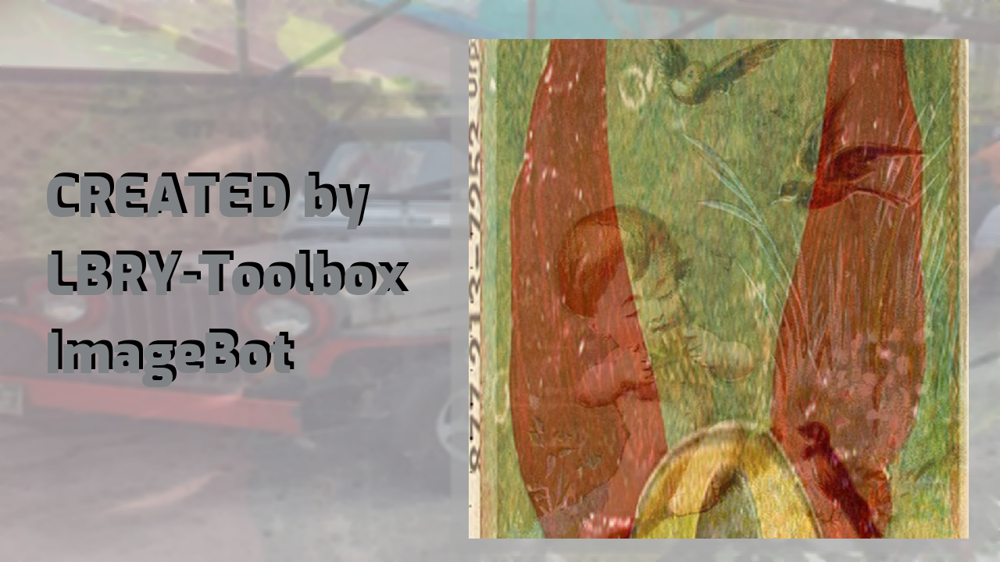

In [145]:
from PIL import ImageFilter, ImageDraw, ImageFont
import time
import shutil
import os
import random
from PIL import Image
from random import randint
path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/GOOD-Blends/'
img = random.choice(os.listdir(path))
path0 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/GOOD-Blends/'
img0 = random.choice(os.listdir(path0))
file_path =path+img
file_path0 =path0+img0
IMG = Image.open(file_path)
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((640,640), Image.NEAREST)
w,h = IMG0.size
IMG1 = IMG0.convert('RGBA')
im =IMG.resize((1280,720), Image.NEAREST)
foreground = Image.new('RGBA', (w+5,h+5), (0, 0, 0, 150))
im.paste(foreground, (580, 60), foreground)
im1 = im.filter(ImageFilter.MinFilter(7))
background = im1.filter(ImageFilter.BLUR)
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(IMG1, (600, 50), IMG1)
background
text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)

if x==1:font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
if x==2:font_file ="/home/jack/fonts/Biryani-Black.ttf"
if x==3:font_file ="/home/jack/fonts/ChangaOne-Regular.ttf"
if x==4:font_file ="/home/jack/fonts/Exo-Black.ttf"
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((30+H, 170+H),text0, colours, font=font)
draw.text((30+H, 270+H),text1, colours, font=font)
draw.text((30+H, 370+H),text2, colours, font=font)
draw.text((30+H-5, 170+H+5),text0, colour, font=font)
draw.text((30+H-5, 270+H+5),text1, colour, font=font)
draw.text((30+H-5, 370+H+5),text2, colour, font=font)
DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
background.save(DT)

from PIL import Image
file_path = DT
IMG = Image.open(file_path)
IMG

In [151]:
for x in range(1,40):
    y= randint(1,4)
    print y,

2 3 3 3 1 2 3 3 2 1 2 2 2 4 4 4 4 3 3 3 2 3 4 2 2 1 2 3 3 1 1 4 1 2 4 1 4 2 2


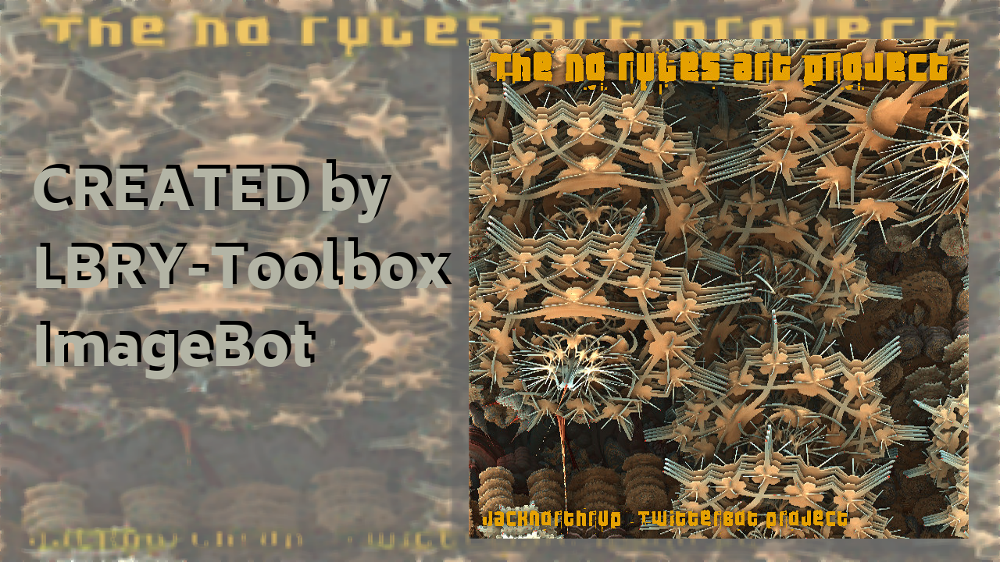

In [141]:
from PIL import ImageFilter, ImageDraw, ImageFont
import time
import shutil
import os
import random
from PIL import Image
from random import randint
path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/forvids/images/'
img = random.choice(os.listdir(path))
file_path =path+img
file_path0 =path+img
IMG = Image.open(file_path)
IMG0 = Image.open(file_path0)
IMG0 =IMG0.resize((640,640), Image.NEAREST)
w,h = IMG0.size
IMG1 = IMG0.convert('RGBA')
im =IMG.resize((1280,720), Image.NEAREST)
foreground = Image.new('RGBA', (w+5,h+5), (0, 0, 0, 150))
im.paste(foreground, (580, 60), foreground)
im1 = im.filter(ImageFilter.MinFilter(7))
background = im1.filter(ImageFilter.BLUR)
foreground1 = Image.new('RGBA', (1280,720), (255, 255, 255, 100))
background.paste(foreground1, (0, 0), foreground1)
background.paste(IMG1, (600, 50), IMG1)
background
text0 = "CREATED by"
text1 = "LBRY-Toolbox"
text2 = "ImageBot"
x= randint(1,4)
r=randint(125,200)
g=randint(125,200)
b=randint(125,200)
colour = (r, g, b)
colours = (0,0,0)

if x==1:font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
if x==2:font_file ="/home/jack/fonts/Biryani-Black.ttf"
if x==3:font_file ="/home/jack/fonts/ChangaOne-Regular.ttf"
if x==4:font_file ="/home/jack/fonts/Exo-Black.ttf"
font_size = 70
font = ImageFont.truetype(font_file, font_size)
w, h = font.getsize(text)
draw = ImageDraw.Draw(background)
H=x*8
draw.text((30+H, 170+H),text0, colours, font=font)
draw.text((30+H, 270+H),text1, colours, font=font)
draw.text((30+H, 370+H),text2, colours, font=font)
draw.text((30+H-5, 170+H+5),text0, colour, font=font)
draw.text((30+H-5, 270+H+5),text1, colour, font=font)
draw.text((30+H-5, 370+H+5),text2, colour, font=font)
DT = time.strftime("images/%Y-%m-%d-%H-%M.png")
background.save(DT)

from PIL import Image
file_path = DT
IMG = Image.open(file_path)
IMG

In [106]:

#image = Image.open(path+img)
print path+img
#shutil.copy(image,"images/image1.jpg")
#shutil.copy(image,"images/image2.jpg")

/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/forvids/images/MutaGen5B93367881C042090506.png


In [127]:
import shutil
import os
import random
from PIL import Image
path = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/forvids/images/'
img = random.choice(os.listdir(path))
img = Image.open(path+img)
def getAverageRGB(img):
  """
  Given PIL Image, return average value of color as (r, g, b)
  """
  # no. of pixels in image
  npixels = image.size[0]*image.size[1]
  # get colors as [(cnt1, (r1, g1, b1)), ...]
  cols = image.getcolors(npixels)
  # get [(c1*r1, c1*g1, c1*g2),...]
  sumRGB = [(x[0]*x[1][0], x[0]*x[1][1], x[0]*x[1][2]) for x in cols] 
  # calculate (sum(ci*ri)/np, sum(ci*gi)/np, sum(ci*bi)/np)
  # the zip gives us [(c1*r1, c2*r2, ..), (c1*g1, c1*g2,...)...]
  avg = tuple([sum(x)/npixels for x in zip(*sumRGB)])
  return avg
print getAverageRGB(img)

(114, 147, 147)


In [92]:
!mv  Retrieve-Twitter-Tweets-Images.html /var/www/lbry-toolbox.com/public/notebooks

In [94]:
!ls *.jpg

10post.jpg  blended20171130172512.jpg  Philippine-Specialty-Paper.jpg  v2.jpg
8post.jpg   LBRY_vps_ImageBot.jpg      postoid (10).jpg		       v3.jpg


In [85]:
!wget https://jacknorthrup.com/jupyter-notebooks/retrieve-firefox-passwords-enter-sqlite-database.html

--2020-02-20 07:31:16--  https://jacknorthrup.com/jupyter-notebooks/retrieve-firefox-passwords-enter-sqlite-database.html
Resolving jacknorthrup.com (jacknorthrup.com)... 192.250.236.207
Connecting to jacknorthrup.com (jacknorthrup.com)|192.250.236.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 376841 (368K) [text/html]
Saving to: ‘retrieve-firefox-passwords-enter-sqlite-database.html’

retrieve-firefox-pa 100%[===================>] 368.01K  --.-KB/s    in 0.008s  

2020-02-20 07:31:16 (46.7 MB/s) - ‘retrieve-firefox-passwords-enter-sqlite-database.html’ saved [376841/376841]



In [77]:
!wget https://jacknorthrup.com/image2/v2.jpg

--2020-02-20 07:20:38--  https://jacknorthrup.com/image2/v2.jpg
Resolving jacknorthrup.com (jacknorthrup.com)... 192.250.236.207
Connecting to jacknorthrup.com (jacknorthrup.com)|192.250.236.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47636 (47K) [image/jpeg]
Saving to: ‘v2.jpg’

v2.jpg              100%[===================>]  46.52K  --.-KB/s    in 0.001s  

2020-02-20 07:20:38 (34.0 MB/s) - ‘v2.jpg’ saved [47636/47636]



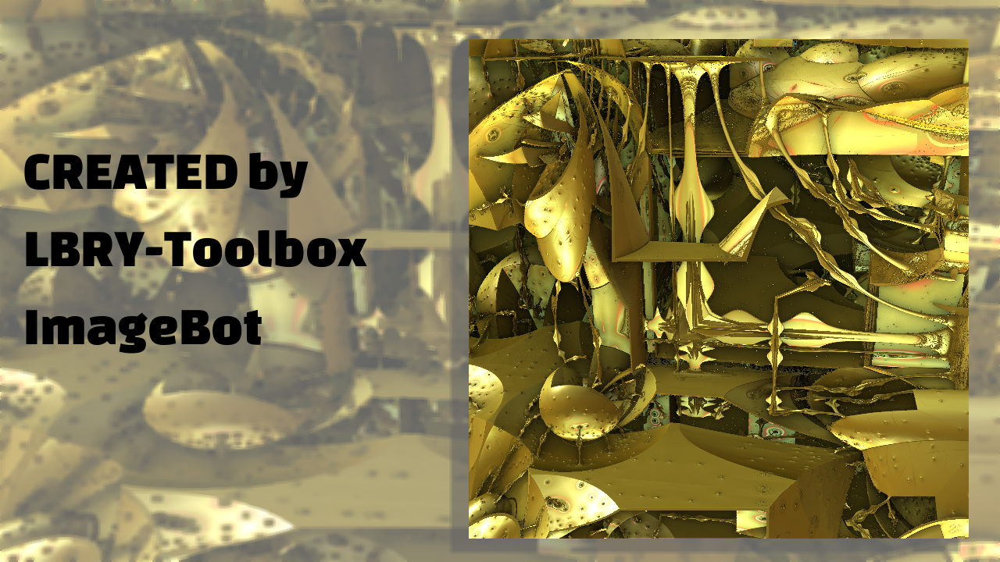

In [95]:
from PIL import Image
file_path = DT
IMG = Image.open(file_path)
IMG

In [ ]:
path = '/home/jack/Desktop/JupyterNotebooks-languages/manybot/'
img = random.choice(os.listdir(path))
file_Path =path+img

IM=Imageopen(file_Path)
IM

In [ ]:
from PIL import ImageFont, ImageDraw, Image
import time
import os
import random
from random import randint
def pick(font_path):    
        
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
def mkimage(path1):
    
    img = random.choice(os.listdir(path1))
    file_path =path1+img 
    return file_path

def mkbatch(mkimage,pick):
    image = Image.open(mkimage)
    image = image.resize((1280,720), Image.NEAREST)
    W,H = image.size
    draw = ImageDraw.Draw(image)
    txt = "Python Generated /Processed Images"
    fontsize = 6 # starting font size

    W, H = image.size

    # portion of image width you want text width to be
    blank = Image.new('RGB',(W, H))

    FONT = pick
    font = ImageFont.truetype(FONT, fontsize)
    #print image.size

    W,H = blank.size
    blank = blank.resize((W-100, H-30,), Image.NEAREST)
    #print blank.size
    while (font.getsize(txt)[0] < blank.size[0]) and (font.getsize(txt)[1] < blank.size[1]):
        # iterate until the text size is just larger than the criteria
        fontsize += 1
        font = ImageFont.truetype(FONT, fontsize)

    # optionally de-increment to be sure it is less than criteria
    fontsize -= 1
    font = ImageFont.truetype(FONT, fontsize)

    w, h = draw.textsize(txt, font=font)

    #print 'final font size',fontsize, FONT
    draw.text((15,625), txt, font=font, fill="black") # put the text on the image
    draw.text((20,620), txt, font=font, fill="white") # put the text on the image
    DT = time.strftime("base/%Y-%m-%d-%H-%M-%S.png")
    image.save(DT) # save it
    #image
for i in range(1,500):
    path1 = '/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/All-images/'
    font_path = '/home/jack/fonts/'
    mkbatch(mkimage(path1),pick(font_path))
    time.sleep(3)
    print ".",

In [2]:
!pwd

/home/jack/Desktop/JupyterNotebooks-languages


In [ ]:
scp /home/jack/Desktop/JupyterNotebooks-languages/images/BGI-056.jpg jack@192.243.108.78:/var/www/lbry-toolbox.com/public/images

In [5]:
!ls /home/jack/Desktop/JupyterNotebooks-languages/images/BGI-056.jpg

/home/jack/Desktop/JupyterNotebooks-languages/images/BGI-056.jpg


In [ ]:
/mnt/40ec525c-34bc-44ef-99c8-53f5524ad88b/Images/data/ancient art

In [ ]:
https://lbry-toolbox.com/images/BGI-056.jpg

In [ ]:
#!/usr/bin/python2
import os
from random import randint
from time import sleep
import time
import urllib
import simplejson as json
import requests
import sys
import subprocess
from Completedpy2 import track_download
import sqlite3
import watchVID
DT = time.strftime("%Y-%m-%d-%H:%M")
name = "Plot-Created-by-LBRYCron-Bot" #no Spaces or Special Characters
title = "LBRY LBC Wallet Balance Plot Generated by a Linux Cron Job"
file_path ="/home/jack/Desktop/JupyterNotebooks-languages/test1280.png"
data = requests.post("http://localhost:5279", json={"method": "publish", "params": {"name": name, "bid": "0.01", "title": title, "file_path": file_path, "tags": "python plot","description":"Wallet balance plot generated by a Linux cron job" , "channel_name": "@MyLinuxToyBox" }}).json()
LINES = (json.dumps(data, indent=2 * ' '))
Lin =str(LINES)
L = Lin.split("\n")
for lines in L:
        print lines


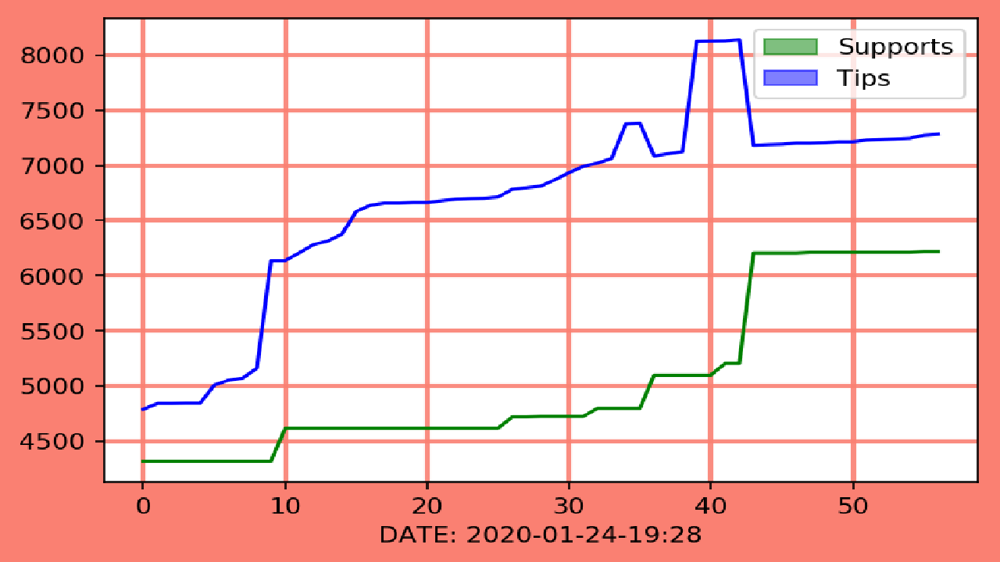

In [13]:
from PIL import Image
file_path ="/home/jack/Desktop/JupyterNotebooks-languages/test-full.png"
IMG = Image.open(file_path)
IM =IMG.resize((1280,720), Image.NEAREST)
im = IM.size
IM.save("/home/jack/Desktop/JupyterNotebooks-languages/test1280.png")
IM

In [2]:
!lbrynet address list --address=bDyZqrP3KoUVjotbdiRsPgkXpqHvASLPrT --page_size=50 --page=1

{
  "items": [
    {
      "account": "bDEEp4Tz9bRfe78uv713o5A5FTfLdQYzU1",
      "address": "bDyZqrP3KoUVjotbdiRsPgkXpqHvASLPrT",
      "pubkey": "xpub69mdgvyDG2wc3SRoqiq2KYVk7gD6WzMeCBNCbQyyPYNFCnpYga7tH5VYVmxbgHLiAb3m27BiMYnqSig2acFUwQeeUVn3KC1havgSCw8yt8v",
      "used_times": 437
    }
  ],
  "page": 1,
  "page_size": 50,
  "total_items": 1,
  "total_pages": 1
}


In [6]:
!lbrynet address list 


{
  "items": [
    {
      "account": "bDEEp4Tz9bRfe78uv713o5A5FTfLdQYzU1",
      "address": "bDyZqrP3KoUVjotbdiRsPgkXpqHvASLPrT",
      "pubkey": "xpub69mdgvyDG2wc3SRoqiq2KYVk7gD6WzMeCBNCbQyyPYNFCnpYga7tH5VYVmxbgHLiAb3m27BiMYnqSig2acFUwQeeUVn3KC1havgSCw8yt8v",
      "used_times": 437
    },
    {
      "account": "bDEEp4Tz9bRfe78uv713o5A5FTfLdQYzU1",
      "address": "bE1dHht38QaJwSeLv6zxXvDEJKLjqxucSy",
      "pubkey": "xpub69mdgvyDG2wcLWyYWCs6YSHaGrFR4ZWXCaL4Z4chopsGgbopj6aL7bnBv4Gvp1Gq8RsuRxz9BuiQx3GnnvHrXzkfAoec1Qf1eYDSJATaCug",
      "used_times": 966
    },
    {
      "account": "bDEEp4Tz9bRfe78uv713o5A5FTfLdQYzU1",
      "address": "bE6VCEc11uTEBAAJawRFjFiezcq7sYFY9K",
      "pubkey": "xpub69mdgvyDG2wcX1hFmqDgNDUvPWKyJ6NyMzQ9uDauiURHsA72wcGFYbCtVGkgK8YQwbtuaXNd3teK1x9sKQEWT6wYgTotxeC9gpawfDQeTGj",
      "used_times": 0
    },
    {
      "account": "bDEEp4Tz9bRfe78uv713o5A5FTfLdQYzU1",
      "address": "bEheRWZHDqtKuyzXb5UZtkRcAaEJTh9ZsZ",
      "pubkey": "xpub69mdgvyDG2wc2zR6

In [10]:
!ls test.jpg

test.jpg


In [ ]:
publish

Create or replace a stream claim at a given name (use 'stream create/update' for more control).
Arguments

name    str    name of the content (can only consist of a-z A-Z 0-9 and -(dash))
bid    optionaldecimal    amount to back the claim
file_path    optionalstr    path to file to be associated with name.
fee_currency    optionalstring    specify fee currency
fee_amount    optionaldecimal    content download fee
fee_address   optionalstr    address where to send fee payments, gefaut value from --claim_address if not provided
title    optionalstr    title of the publication
description    optionalstr    description of the publication
author    optionalstr    author of the publication. The usage for this field is not the same as for channels.
The author field is used to credit an author who is not the publisher and is not represented by the
channel. For example, a pdf file of 'The Odyssey' has an author of 'Homer' but may by published to a
channel such as '@classics', or to no channel at all
tags    optionallist    add content tags
languages    optionallist    languages used by the channel, using RFC 5646 format, eg: for English 
    `--languages=en` for Spanish (Spain) `--languages=es-ES` for Spanish (Mexican) `--languages=es-MX`
    for Chinese (Simplified) `--languages=zh-Hans` for Chinese (Traditional) `--languages=zh-Hant`
locations    optionallist    locations relevant to the stream, consisting of 2 letter `country` 
code and a `state`, `city` and a postal `code` along with a `latitude` and `longitude`. for JSON RPC:
    pass a dictionary with aforementioned attributes as keys,
eg: ... "locations": [{'country': 'US', 'state': 'NH'}] ... for command line: pass a colon delimited 
list with values in the following order: "COUNTRY:STATE:CITY:CODE:LATITUDE:LONGITUDE" making
sure to include colon for blank values, for example to provide only the 
city: ... --locations="::Manchester" with all values set: ...
--locations="US:NH:Manchester:03101:42.990605:-71.460989" optionally, you can just pass 
the "LATITUDE:LONGITUDE": ... --locations="42.990605:-71.460989" finally, you can also pass 
JSON string of dictionary on the command line as you would via JSON RPC ...
 --locations="{'country': 'US', 'state': 'NH'}"
    license
    optionalstr
    publication license
    license_url
    optionalstr
    publication license url
    thumbnail_url
    optionalstr
    thumbnail url
    release_time
    optionalint
    original public release of content, seconds since UNIX epoch
    width
    optionalint
    image/video width, automatically calculated from media file
    height
    optionalint
    image/video height, automatically calculated from media file
    duration
    optionalint
    audio/video duration in seconds, automatically calculated
    channel_id
    optionalstr
    claim id of the publisher channel
    channel_name
    optionalstr
    name of publisher channel
    channel_account_id
    optionalstr
    one or more account ids for accounts to look in for channel certificates, defaults to all accounts.
    account_id
    optionalstr
    account to use for holding the transaction
    wallet_id
    optionalstr
    restrict operation to specific wallet
    funding_account_ids
    optionallist
    ids of accounts to fund this transaction
    claim_address
    optionalstr
    address where the claim is sent to, if not specified it will be determined automatically from the account
    preview
    optionalbool
    do not broadcast the transaction
    blocking
    optionalbool
    wait until transaction is in mempool


!locate *.ttf

In [ ]:
def pick():    
        font_path = '/home/jack/fonts/'
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
for i in range(1,100):
    print pick()    

!ls /home/jack/fonts

In [104]:
def getAverageRGB(img):
  """
  Given PIL Image, return average value of color as (r, g, b)
  """
  # no. of pixels in image
  npixels = image.size[0]*image.size[1]
  # get colors as [(cnt1, (r1, g1, b1)), ...]
  cols = image.getcolors(npixels)
  # get [(c1*r1, c1*g1, c1*g2),...]
  sumRGB = [(x[0]*x[1][0], x[0]*x[1][1], x[0]*x[1][2]) for x in cols] 
  # calculate (sum(ci*ri)/np, sum(ci*gi)/np, sum(ci*bi)/np)
  # the zip gives us [(c1*r1, c2*r2, ..), (c1*g1, c1*g2,...)...]
  avg = tuple([sum(x)/npixels for x in zip(*sumRGB)])
  return avg
print getAverageRGB(img)

(114, 147, 147)


In [193]:
#https://stackoverflow.com/questions/24021579/how-to-set-appropriate-line-width-for-drawing-text-in-python-pil
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw 
import textwrap
def pick():    
        font_path = '/home/jack/fonts/'
        font=random.choice([x for x in os.listdir(font_path) if os.path.isfile(os.path.join(font_path, x))])
        return font_path+font
    
size_x = 600 #This value can arbitrarily change
size_y = 700 #This value can arbitrarily change
font_size = 18 #This value can be adjusted to fit parameters of image if necessary

my_text = ['Lorem ipsum dolor sit amet, consectetur adipiscing elit. Etiam scelerisque sapien convallis nisl facilisis, sed facilisis odio accumsan. Maecenas vel leo eu turpis porta dictum at vel neque. Donec sagittis felis non tellus lacinia facilisis. Vivamus vel nisi ullamcorper, feugiat lorem sagittis, pellentesque dolor. Curabitur est magna, feugiat ut nibh quis, blandit vestibulum nisl. Sed pulvinar condimentum purus et rutrum. Proin magna arcu, scelerisque at gravida ut, convallis quis orci. Mauris ipsum tortor, laoreet et leo ac, lacinia euismod tellus. Curabitur volutpat nisi a metus faucibus, vel iaculis nisl fermentum. Curabitur et orci id sapien porttitor dignissim at ac dolor. Donec nec mattis nisi. ']

tx = Image.new('RGB', (size_x, size_y),color=(255,255,255))
draw = ImageDraw.Draw(tx)
randomfont=pick()
my_font = ImageFont.truetype(randomfont,size=font_size)
lines = textwrap.wrap(my_text[0], width = 130) #This width value needs to be set automatically
y_text = 0
for line in lines:
    width, height = my_font.getsize(line)
    draw.text((0, y_text), line, font = my_font, fill = (0,0,0))
    y_text += height

tx.show()

In [57]:
!ls /home/jack/Desktop/post

202002200046-POST.png  pil_text.png


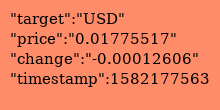

In [60]:
from PIL import Image
image = Image.open("/home/jack/Desktop/post/pil_text.png")
image

In [96]:
!ls -rant /home/jack/Desktop/VPS_resources

total 544
-rw-rw-r-- 1 1000 1000  23600 Feb 20 00:23 202002200023-full.png
-rw-rw-r-- 1 1000 1000 112278 Feb 20 00:46 202002200046-final.png
-rw-rw-r-- 1 1000 1000 112978 Feb 20 00:55 202002200055-final.png
-rw-rw-r-- 1 1000 1000  24070 Feb 20 01:06 202002200106-full.png
-rw-rw-r-- 1 1000 1000 113239 Feb 20 01:06 202002200106-final.png
drwxrwxr-x 9 1000 1000   4096 Feb 20 04:17 ..
-rw-rw-r-- 1 1000 1000  32762 Feb 20 10:16 202002201016-full.png
drwxrwxr-x 2 1000 1000   4096 Feb 20 10:16 .
-rw-rw-r-- 1 1000 1000 122404 Feb 20 10:16 202002201016-final.png


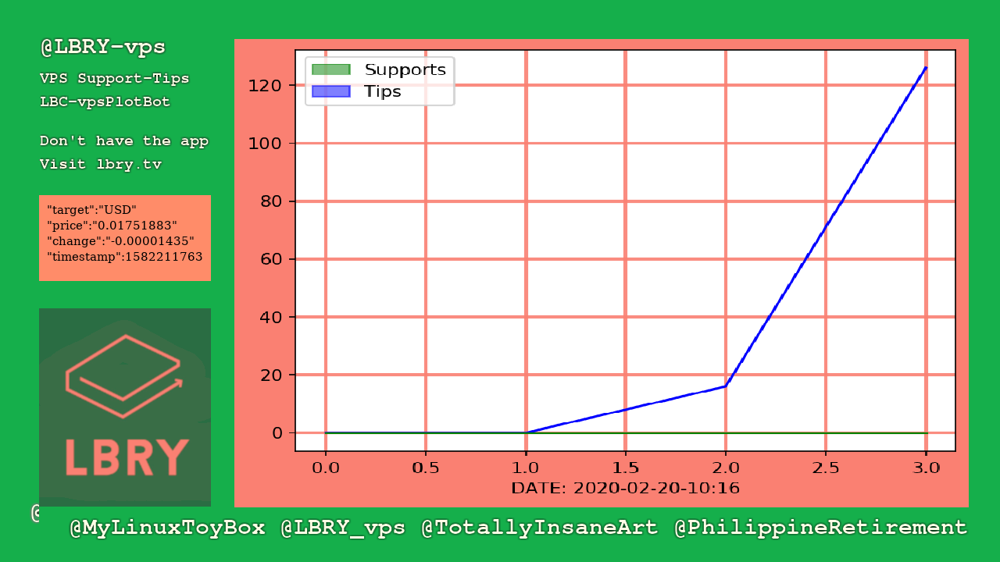

In [97]:
from PIL import Image
image = Image.open("/home/jack/Desktop/VPS_resources/202002201016-final.png")
image

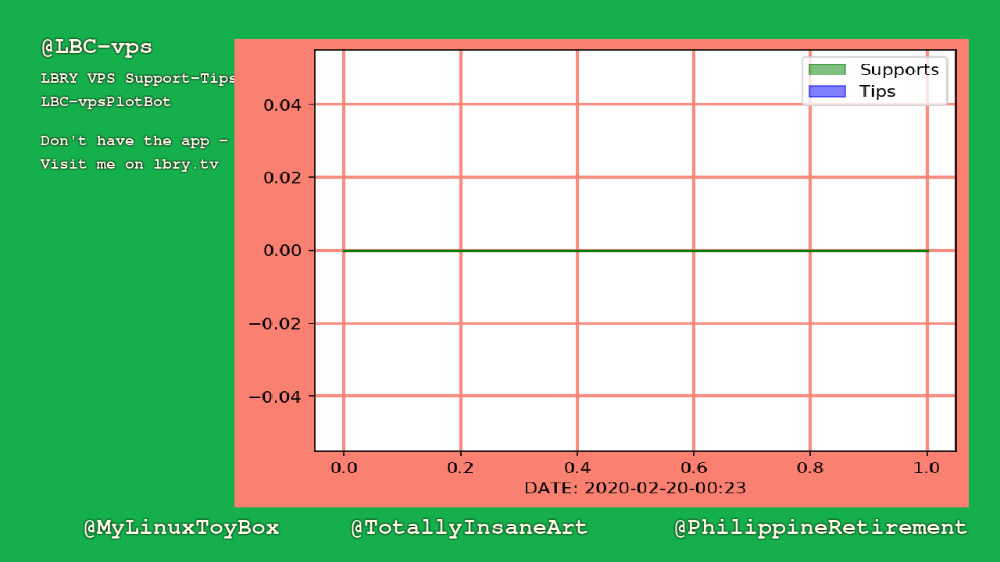

In [59]:
from PIL import Image
image = Image.open("/home/jack/Desktop/post/202002200046-POST.png")
image

In [21]:
!cp base/2020-02-21-04-59-24.png /var/www/lbry-toolbox.com/public/images

https://lbry-toolbox.com/images/2020-02-21-04-59-24.png

In [24]:
from IPython.core.display import HTML
HTML("""
<style>
#notebook-container {
    padding: 15px;
    background-color: #E3F6FF;
    min-height: 0;
    -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.3);
    box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.3);
}
.notebook_app {
    background-color: lightblue;
}
#header{
background-color: #ffebcd;
}
#notebook_name.filename{
color:DarkRed;
font-size:200%;
}
body #header{
background-color:#F9E1DF;
}
</style>
""")
